# Blood Smear System Imaging Accuracy

## Phase Accuracy  
Phase image of phase random plate

In [6]:
import importlib
from os.path import join, isfile

import numpy as np
import matplotlib.pyplot as plt
from cv2 import imread, IMREAD_GRAYSCALE
from skimage.util import crop, img_as_float32
from skimage.transform import AffineTransform, warp

import cccode
from cccode.image import ck, phasermic_imsplit, LowFrequencyFilter
from cccode.tie_tech import (ImageRegister, affine_transform, sigmoid_focus, fast_denoise,
                             energy_match, tie_solution, tie_solve_differential)

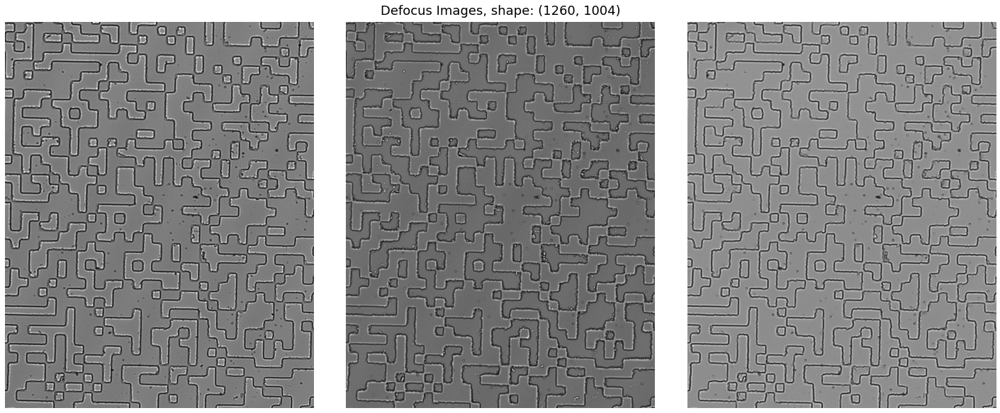

In [2]:
# Phase random plate
ResourcePath = "D:\\Database\\prism_dual-tie_dataset\\20201016"
prp_fullname = join(ResourcePath, "05_pm_d1mm_w632.bmp")
prp_dualfocus = imread(prp_fullname, IMREAD_GRAYSCALE).astype(np.float32)/256
prp_minus, prp_plus = phasermic_imsplit(prp_dualfocus)
prp_minus, prp_plus = energy_match(prp_minus, prp_plus)

def process_fn(img):
    img = img_as_float32(img)
    img = LowFrequencyFilter.interest_filtering(img, 10)
    return sigmoid_focus(fast_denoise(img))

# Registering
reg_mat = ImageRegister.align(prp_plus, prp_minus, cache_fname=join(ResourcePath, "subview_tform.pkl"), 
                               reproduce=False, epochs=10, out_mat=True, process_fn=process_fn)
prp_plus = affine_transform(prp_plus, reg_mat)

# Remove Redandent
prp_minus, prp_plus = [crop(img, ((10, 10), (10, 10))) for img in (prp_minus, prp_plus)]

ck.img_show(prp_minus, prp_plus, (prp_minus/2+prp_plus/2), figsize=(20, 8), 
            title="Defocus Images, shape: {}".format(prp_minus.shape))

Prepare Low-fre Noise Free Intensities

In [3]:
minus_corrected, plus_corrected, focus_corrected = \
    [LowFrequencyFilter.interest_filtering(img, 10) for img in (prp_minus, prp_plus, (prp_minus/2+prp_plus/2))]

### Solve Phase

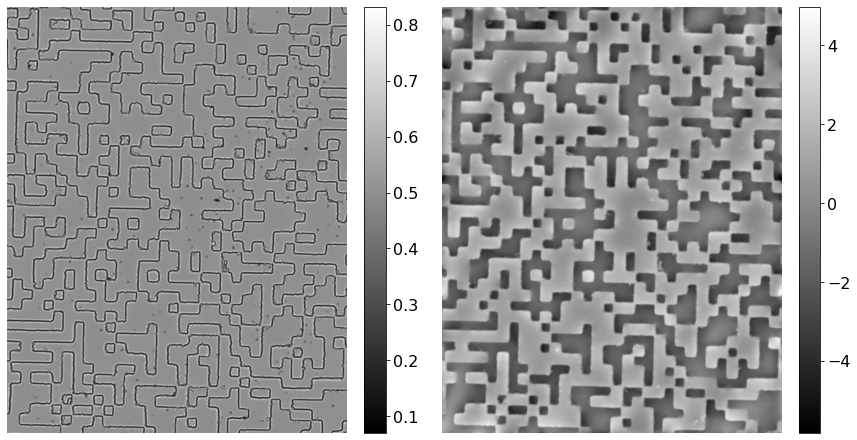

In [4]:
# Calculate difference and remove string backgrounds
defocus_diff = prp_plus - prp_minus
diff_corrected = LowFrequencyFilter.interest_filtering(defocus_diff, 10)

# Solve phase from diff
tie_params = {
    "wavelength": 632.8e-9,
    "pixel_size": 4.8e-6,
    "epsilon": 5e7
}
phase = tie_solve_differential(focus_corrected, diff_corrected/1e-3, **tie_params)
ck.img_show(focus_corrected, phase, colorbar=True, figsize=(12, 6))

### Image output

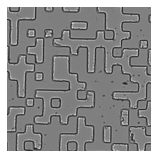

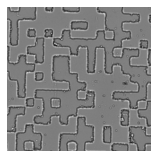

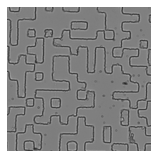

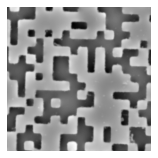

In [7]:
def picture_produce(figsize):
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_xticks([])
    ax.set_yticks([])
    for sp in ["top", "bottom", "right", "left"]:
        ax.spines[sp].set_visible(False)
    plt.tight_layout(pad=0)
    return fig, ax

# ROI Images
dst_h, dst_w = (512, 512)
org_h, org_w = (300, 200)
minus_roi, plus_roi, focus_roi, phase_roi = list(map(lambda img: img[org_h:org_h+dst_h, org_w:org_w+dst_w],
                                                     [minus_corrected, plus_corrected, focus_corrected, phase]))

figures_savefpath = "D:\\Postgraduate\\Investigate\\Blood Recognition\\data\\phase accuracy"
for img, name in zip([minus_roi, plus_roi, focus_roi, phase_roi],
                     ["minus_roi.tif", "plus_roi.tif", "focus_roi.tif", "phase_roi.tif"]):
    fig, ax = picture_produce((2, 2))
    vmin, vmax = (None, None) if name == "phase_roi.tif" else (0., 1.)
    ax.imshow(img, cmap="gray", vmin=vmin, vmax=vmax)
    fig.savefig(join(figures_savefpath, name), dpi=300)

Phase profiles 

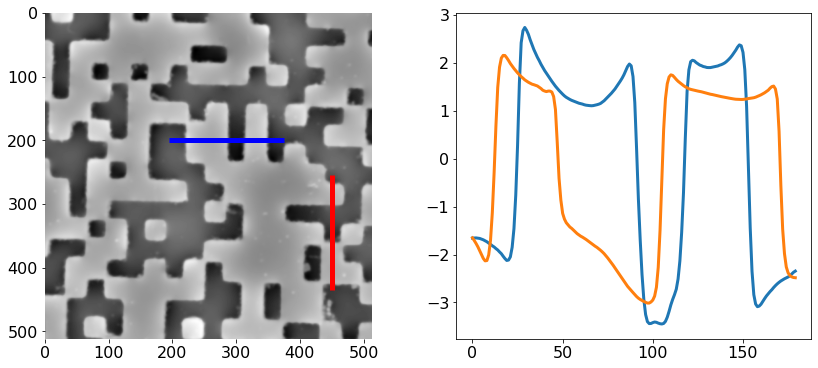

In [14]:
def image_profile(img, line_position, endpoints, orientation):
    start, end = endpoints
    if orientation == "horizontal":
        profile_line = img[line_position, start:end]
    elif orientation == "vertical":
        profile_line = img[start:end, line_position]
    else:
        raise KeyError(f"The 'orientation' should be 'horizontal' or 'vertical', but '{orientation}' is given.")
    return profile_line

profile_params = (
    {"orientation": "horizontal", "line_position": 200, "endpoints": (195, 375)},
    {"orientation": "vertical", "line_position": 450, "endpoints": (255, 435)}
)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(phase_roi, cmap="gray")
for sp in ["top", "bottom", "right", "left"]:
    axes[0].spines[sp].set_visible(False)
tgt_phase_profile_lines = []
for prof_param in profile_params:
    ori, pos, (start, end) = prof_param["orientation"], prof_param["line_position"], prof_param["endpoints"]
    if ori == "horizontal":
        axes[0].hlines(pos, start, end, colors="blue", linewidths=5)
    else:
        axes[0].vlines(pos, start, end, colors="red", linewidths=5)
    profile_line = image_profile(phase_roi, **prof_param)
    axes[1].plot(profile_line, linewidth=3)
    tgt_phase_profile_lines.append(profile_line)

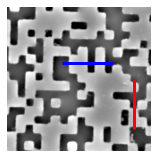

In [25]:
fig, ax = plt.subplots(figsize=(2, 2))
ax.imshow(phase_roi, cmap="gray", vmin=-3.5, vmax=3)
ax.set_xticks([])
ax.set_yticks([])
for sp in ["top", "bottom", "right", "left"]:
    ax.spines[sp].set_visible(False)
for prof_param in profile_params:
    ori, pos, (start, end) = prof_param["orientation"], prof_param["line_position"], prof_param["endpoints"]
    if ori == "horizontal":
        ax.hlines(pos, start, end, colors="blue", linewidths=3)
    else:
        ax.vlines(pos, start, end, colors="red", linewidths=3)
plt.tight_layout(pad=0)
plt.savefig(join(figures_savefpath, "line_labeled_phase.tif"), dpi=300)

In [17]:
# save the profile lines as csv
tgt_phase_profile_lines = np.stack(tgt_phase_profile_lines, axis=1)

import csv

profile_lines_savefpath = "D:\\Postgraduate\\Investigate\\Blood Recognition\\data\\phase accuracy"
with open(join(profile_lines_savefpath, "phase_profiles.csv"), "w") as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(["Horizontal", "Vertical"])
    csvwriter.writerows(tgt_phase_profile_lines.tolist())

## Intensity Resolution

### Data load

In [1]:
import csv
import numpy as np
from os.path import join

import PIL
%matplotlib inline
import matplotlib.pyplot as plt
from cv2 import imread, IMREAD_GRAYSCALE
from cccode.tie_tech import ImageRegister, affine_transform, tie_solution
from cccode.image import ck

plt.rcParams["xtick.labelsize"] = 12
plt.rcParams["ytick.labelsize"] = 12

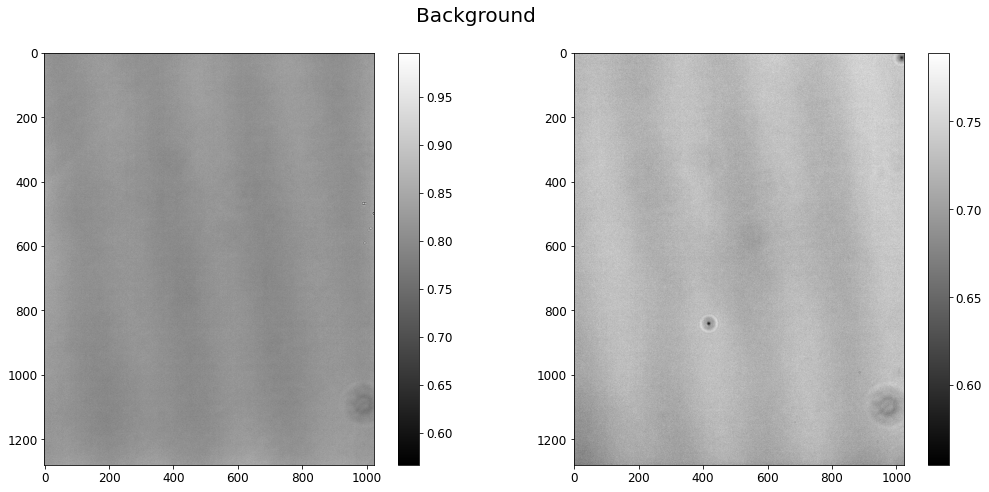

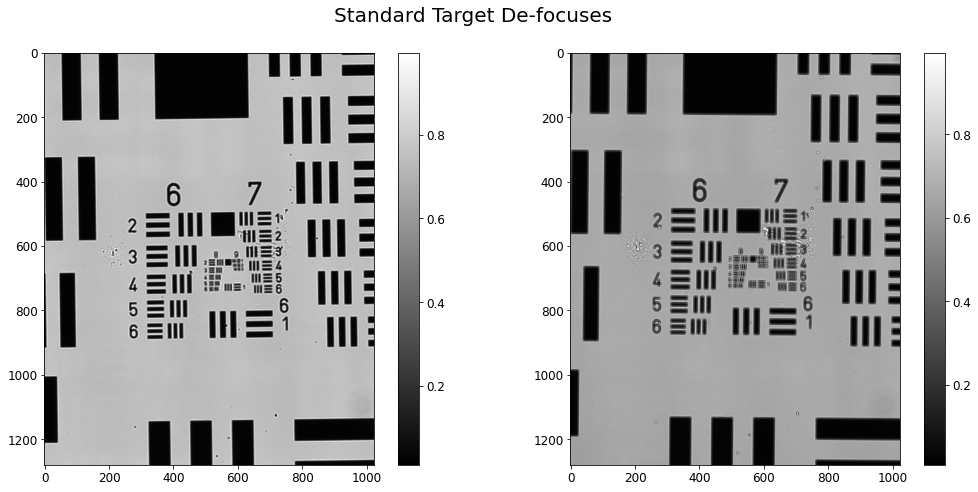

In [2]:
DataFpath = "D:\\Postgraduate\\Investigate\\Blood Recognition\\data\\system resolution"

background_imgfilename = join(DataFpath, "background.bmp")
std_target_imgfilename = join(DataFpath, "usaf1952_w5326_d1.bmp")

def image_separating(img):
    minus, plus = np.hsplit(img, 2)
    minus = np.rot90(np.fliplr(minus), k=-1)
    plus = np.rot90(plus, k=-1)
    return minus, plus

# read images from disk
background_img = imread(background_imgfilename, flags=IMREAD_GRAYSCALE).astype(np.float32)/256.
std_target_img = imread(std_target_imgfilename, flags=IMREAD_GRAYSCALE).astype(np.float32)/256.
# separate jointed image into individual images
background_minus, background_plus = image_separating(background_img)
std_target_minus, std_target_plus = image_separating(std_target_img)

# Images visualize
for im_minus, im_plus, title in ([background_minus, background_plus, "Background"], 
                                 [std_target_minus, std_target_plus, "Standard Target De-focuses"]):
    plt.figure(figsize=(15, 7))
    plt.suptitle(title, fontsize=20)
    plt.subplot(121)
    plt.imshow(im_minus, cmap="gray")
    plt.colorbar()
    plt.subplot(122)
    plt.imshow(im_plus, cmap="gray")
    plt.colorbar()
    plt.tight_layout(pad=1)
    plt.show()

### Background eliminating

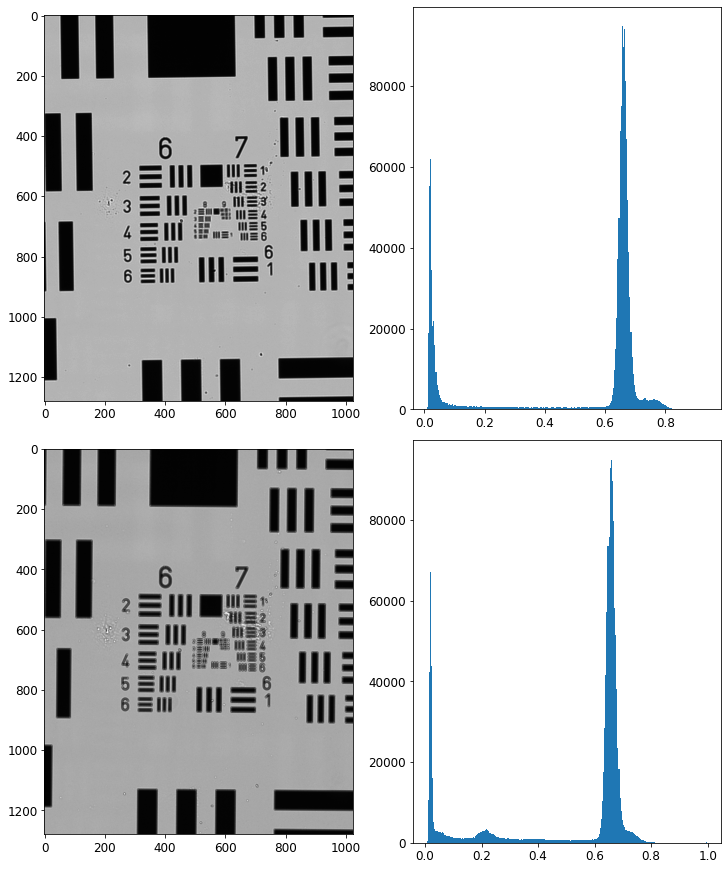

In [3]:
# Normalize the backgound
background_minus, background_plus = list(map(lambda img: img/np.mean(img), [background_minus, background_plus]))
# Remove backgrounds
std_target_minus /= background_minus
std_target_plus /= background_plus
# Balance energy
mean_intensity = np.min([np.mean(std_target_minus), np.mean(std_target_plus)])
std_target_minus = np.clip(std_target_minus*mean_intensity/np.mean(std_target_minus), 0., 1.)
std_target_plus = np.clip(std_target_plus*mean_intensity/np.mean(std_target_plus), 0., 1.)

ck.hist(std_target_minus, std_target_plus, figsize=(10, 12), ticks=True)

### Image Registering

In [4]:
tform_cache_filename = join(DataFpath, "usaf_tform.pkl")
tform_mat = ImageRegister.align(std_target_minus, std_target_plus, cache_fname=tform_cache_filename, 
                                epochs=10, out_mat=True, reproduce=False)
std_target_minus_tformed = affine_transform(std_target_minus, tform_mat)

### Figure Producing
figures output for research plotting

#### ROI Images

In [18]:
def roi_select(img, hcut=(380, 380), wcut=(242, 262)):
    _h, _w = img.shape
    (_hf, _hb), (_wf, _wb) = hcut, wcut
    return img[_hf:_h-_hb, _wf:_w-_w-_wb]

def picture_produce(figsize):
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_xticks([])
    ax.set_yticks([])
    for sp in ["top", "bottom", "right", "left"]:
        ax.spines[sp].set_visible(False)
    plt.tight_layout(pad=0)
    return fig, ax

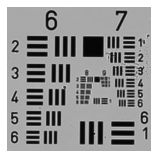

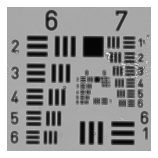

In [20]:
target_minus_roi = roi_select(std_target_minus_tformed)
target_plus_roi = roi_select(std_target_plus)
target_focus_roi = (target_minus_roi+target_plus_roi)/2

products_savefpath = join(DataFpath, "products")
save_config = [("target_minus_roi.tif", target_minus_roi),
               ("target_plus_roi.tif", target_plus_roi),
               ("target_focus_roi.tif", target_focus_roi)]

for name, img in save_config[:2]:
    save_fullname = join(products_savefpath, name)
    fig, ax = picture_produce((2, 2))
    ax.imshow(img, cmap="gray", vmin=0., vmax=1.)
    fig.savefig(save_fullname, dpi=300)

#### Image Profiles

In [12]:
def image_profile(img, line_position, endpoints, orientation):
    start, end = endpoints
    if orientation == "horizontal":
        profile_line = img[line_position, start:end]
    elif orientation == "vertical":
        profile_line = img[start:end, line_position]
    else:
        raise KeyError(f"The 'orientation' should be 'horizontal' or 'vertical', but '{orientation}' is given.")
    return profile_line

profile_params = (
    {"orientation": "horizontal", 
     "line_position": 345, 
     "endpoints": (398, 432)},
    {"orientation": "vertical", 
     "line_position": 447, 
     "endpoints": (330, 364)},
#     {"orientation": "vertical", 
#      "line_position": 272, 
#      "endpoints": (246, 275)}
)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(target_focus_roi, cmap="gray")
for sp in ["top", "bottom", "right", "left"]:
    axes[0].spines[sp].set_visible(False)
profile_lines = []
for prof_param in profile_params:
    ori, pos, (start, end) = prof_param["orientation"], prof_param["line_position"], prof_param["endpoints"]
    if ori == "horizontal":
        axes[0].hlines(pos, start, end, colors="blue", linewidths=3)
    else:
        axes[0].vlines(pos, start, end, colors="red", linewidths=3)
    profile_line = image_profile(target_focus_roi, **prof_param)
    axes[1].plot(profile_line, linewidth=3)
    profile_lines.append(profile_line)

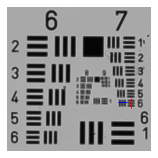

In [17]:
fig, ax = plt.subplots(figsize=(2, 2))
ax.imshow(target_focus_roi, cmap="gray", vmin=0, vmax=1.)
ax.set_xticks([])
ax.set_yticks([])
for sp in ["top", "bottom", "right", "left"]:
    ax.spines[sp].set_visible(False)
for prof_param in profile_params:
    ori, pos, (start, end) = prof_param["orientation"], prof_param["line_position"], prof_param["endpoints"]
    if ori == "horizontal":
        ax.hlines(pos, start, end, colors="blue", linewidths=1)
    else:
        ax.vlines(pos, start, end, colors="red", linewidths=1)
plt.tight_layout(pad=0)
plt.savefig(join(DataFpath, "products", "target_focus_roi.tif"), dpi=300)

In [10]:
# save lines with csv
profile_lines_filename = join(DataFpath, "focus_roi_profile_lines.csv")
with open(profile_lines_filename, "w") as csvfile:
    csvwriter = csv.DictWriter(csvfile, fieldnames=("Horizontal", "Vertical"))
    csvwriter.writeheader()
    for hori, verti in zip(*profile_lines):
        csvwriter.writerow({"Horizontal": hori, "Vertical": verti})

### Solve phase (just for checking)

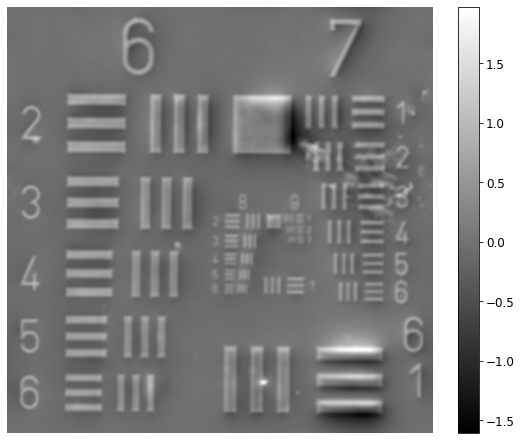

In [11]:
tie_params = {
    "delta_d": 1e-3,
    "pixel_size": 4.8e-6,
    "wavelength": 632.8e-9,
    "epsilon": 1e8
}

target_phase_roi = tie_solution(target_focus_roi, target_minus_roi, target_plus_roi, **tie_params)
ck.img_show(target_phase_roi, figsize=(8, 6), colorbar=True)

### All In-focus ROI

In [11]:
DataFpath = "D:\\Postgraduate\\Investigate\\Blood Recognition\\data\\system resolution"

background_imgfilename = join(DataFpath, "background.bmp")
std_target_imgfilename_infocus = join(DataFpath, "both_in_focus.bmp")

def image_separating(img):
    minus, plus = np.hsplit(img, 2)
    minus = np.rot90(np.fliplr(minus), k=-1)
    plus = np.rot90(plus, k=-1)
    return minus, plus

def roi_select(img, hcut=(380, 380), wcut=(242, 262)):
    _h, _w = img.shape
    (_hf, _hb), (_wf, _wb) = hcut, wcut
    return img[_hf:_h-_hb, _wf:_w-_w-_wb]

def picture_produce(figsize):
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_xticks([])
    ax.set_yticks([])
    for sp in ["top", "bottom", "right", "left"]:
        ax.spines[sp].set_visible(False)
    plt.tight_layout(pad=0)
    return fig, ax

# read images from disk
background_img = imread(background_imgfilename, flags=IMREAD_GRAYSCALE).astype(np.float32)/256.
std_target_img = imread(std_target_imgfilename_infocus, flags=IMREAD_GRAYSCALE).astype(np.float32)/256.
# separate jointed image into individual images
background_minus, background_plus = image_separating(background_img)
std_target_minus, std_target_plus = image_separating(std_target_img)

# Normalize the backgound
background_minus, background_plus = list(map(lambda img: img/np.mean(img), [background_minus, background_plus]))
# Remove backgrounds
std_target_minus /= background_minus
std_target_plus /= background_plus
# Balance energy
mean_intensity = np.min([np.mean(std_target_minus), np.mean(std_target_plus)])
std_target_minus = np.clip(std_target_minus*mean_intensity/np.mean(std_target_minus), 0., 1.)
std_target_plus = np.clip(std_target_plus*mean_intensity/np.mean(std_target_plus), 0., 1.)

# Image registering
tform_cache_filename = join(DataFpath, "usaf_tform.pkl")
tform_mat = ImageRegister.align(std_target_minus, std_target_plus, cache_fname=tform_cache_filename, 
                                epochs=10, out_mat=True, reproduce=False)
std_target_minus_tformed = affine_transform(std_target_minus, tform_mat)

# RoI select
products_savefpath = join(DataFpath, "products")
target_focus_roi = roi_select(std_target_plus)

    
def image_profile(img, line_position, endpoints, orientation):
    start, end = endpoints
    if orientation == "horizontal":
        profile_line = img[line_position, start:end]
    elif orientation == "vertical":
        profile_line = img[start:end, line_position]
    else:
        raise KeyError(f"The 'orientation' should be 'horizontal' or 'vertical', but '{orientation}' is given.")
    return profile_line

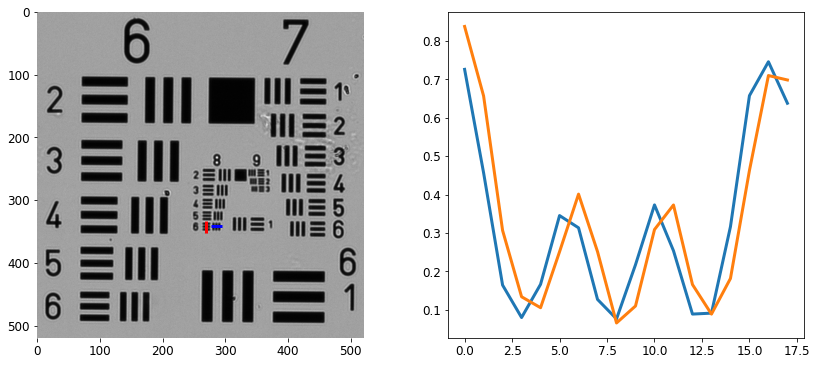

In [37]:
profile_params = ({"orientation": "horizontal", 
                   "line_position": 342, 
                   "endpoints": (277, 295)},
                  {"orientation": "vertical", 
                   "line_position": 269, 
                   "endpoints": (334, 352)})

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(target_focus_roi, cmap="gray")
for sp in ["top", "bottom", "right", "left"]:
    axes[0].spines[sp].set_visible(False)
profile_lines = []
for prof_param in profile_params:
    ori, pos, (start, end) = prof_param["orientation"], prof_param["line_position"], prof_param["endpoints"]
    if ori == "horizontal":
        axes[0].hlines(pos, start, end, colors="blue", linewidths=3)
    else:
        axes[0].vlines(pos, start, end, colors="red", linewidths=3)
    profile_line = image_profile(target_focus_roi, **prof_param)
    axes[1].plot(profile_line, linewidth=3, color=("b", "r")[i])
    profile_lines.append(profile_line)

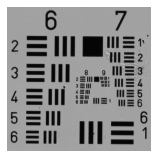

In [47]:
fig, ax = plt.subplots(figsize=(2, 2))
ax.imshow(target_focus_roi, cmap="gray", vmin=0, vmax=1.)
ax.set_xticks([])
ax.set_yticks([])
for sp in ["top", "bottom", "right", "left"]:
    ax.spines[sp].set_visible(False)
# for prof_param in profile_params:
#     ori, pos, (start, end) = prof_param["orientation"], prof_param["line_position"], prof_param["endpoints"]
#     if ori == "horizontal":
#         ax.hlines(pos, start, end, colors="blue", linewidths=1)
#     else:
#         ax.vlines(pos, start, end, colors="red", linewidths=1)
plt.tight_layout(pad=0)
plt.savefig(join(DataFpath, "products", "target_real_focus_roi.tif"), dpi=300)

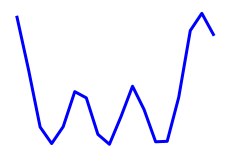

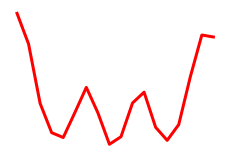

In [46]:
for i, prof_param in enumerate(profile_params):
    fig, ax = plt.subplots(figsize=(3, 2))
    ax.set_xticks([])
    ax.set_yticks([])
    for sp in ["top", "bottom", "right", "left"]:
        ax.spines[sp].set_visible(False)
    profile_line = image_profile(target_focus_roi, **prof_param)
    ax.plot(profile_line, linewidth=3, color=("b", "r")[i])
    plt.tight_layout(pad=0.)
    savename = "group8elm6_{}.tif".format(prof_param["orientation"])
    # print(savename)
    plt.savefig(join(DataFpath, savename), dpi=100)

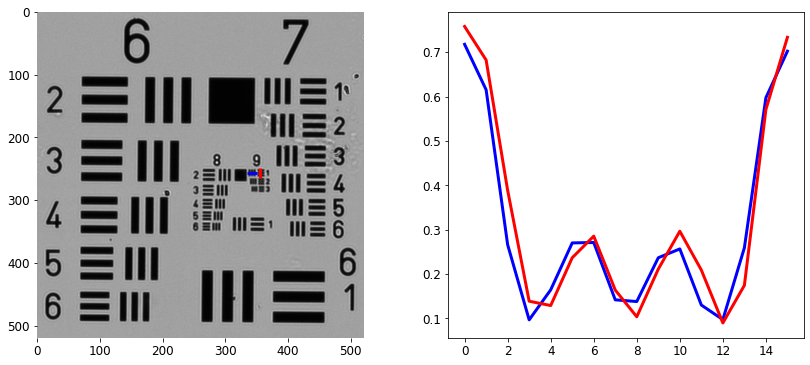

In [33]:
profile_params = ({"orientation": "horizontal", 
                   "line_position": 257, 
                   "endpoints": (334, 350)},
                  {"orientation": "vertical", 
                   "line_position": 355, 
                   "endpoints": (249, 265)})

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(target_focus_roi, cmap="gray")
for sp in ["top", "bottom", "right", "left"]:
    axes[0].spines[sp].set_visible(False)
profile_lines = []
for i, prof_param in enumerate(profile_params):
    ori, pos, (start, end) = prof_param["orientation"], prof_param["line_position"], prof_param["endpoints"]
    if ori == "horizontal":
        axes[0].hlines(pos, start, end, colors="blue", linewidths=3)
    else:
        axes[0].vlines(pos, start, end, colors="red", linewidths=3)
    profile_line = image_profile(target_focus_roi, **prof_param)
    axes[1].plot(profile_line, linewidth=3, color=("b", "r")[i])
    profile_lines.append(profile_line)

## Large FoV Imaging

In [2]:
from os.path import join

import numpy as np
import matplotlib.pyplot as plt
from numpy import clip, quantile
from scipy.io import loadmat, savemat
from skimage.util import img_as_ubyte
from matplotlib.patches import Rectangle

from cccode.image import ck
from Deeplearning.util.functions import image_baseline
from Deeplearning.util.functions import figure_preproduction

### Load Wavefront

In [3]:
# File Pathes
ResourceFpath = "D:\\Database\\red_blood_cell\\2021-12-05"
WavefrontMatfile = join(ResourceFpath, "ffov_wavefront.mat")

""" Process the large FoV whole blood wavefront produced by dual-view TIE.
Recognize the RBC cells inside blood smear views using DL network."""
wavefront_dict = loadmat(WavefrontMatfile)
minus, plus, focus, phase = [wavefront_dict.get(name) for name in ("minus", "plus", "focus", "phase")]

def imclip(x): return clip(x, quantile(x, 0.001), quantile(x, 0.999))

# focus histogram adjust: sigmoid
minus, plus, focus = [imclip(img_as_ubyte(img)) for img in (minus, plus, focus)]
# remove phase background through rank otsu-thresholding
phase -= image_baseline(phase, 100, scale=0.3)

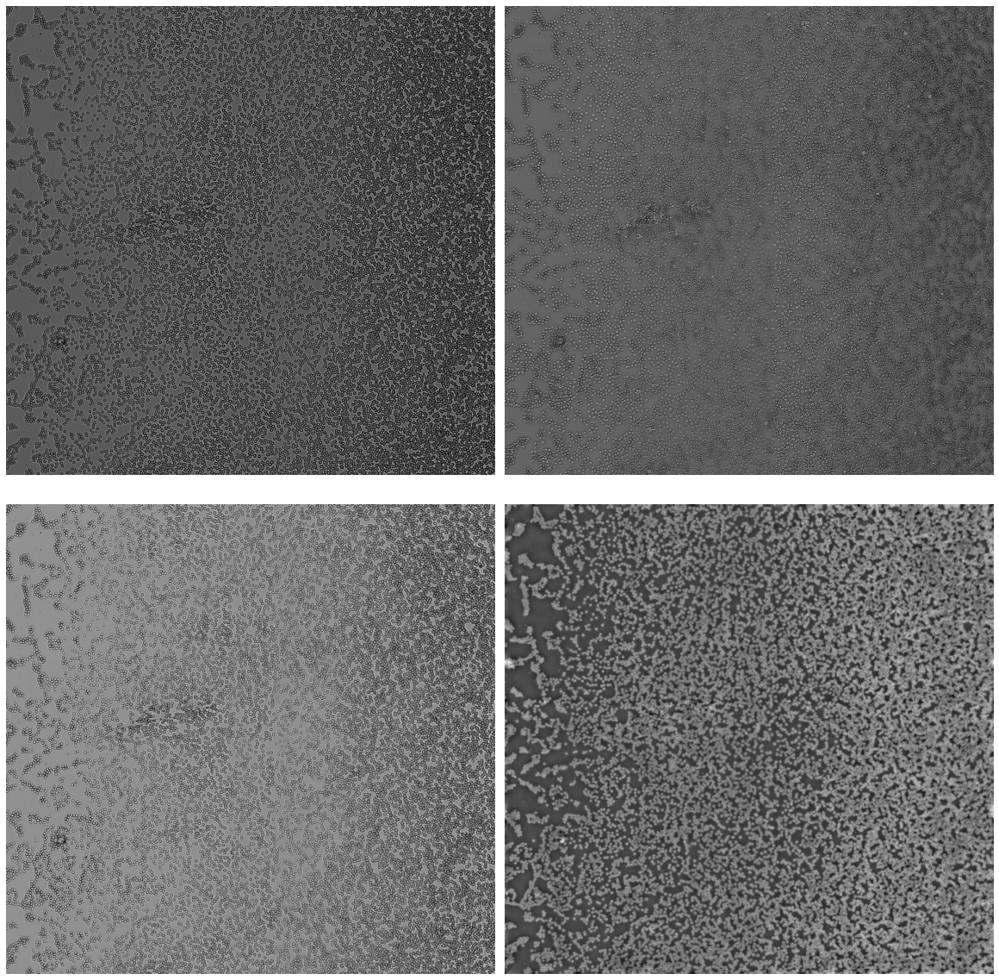

In [4]:
ck.img_show(minus, plus, focus, phase, figsize=(16, 16))

### Save FFoV images 

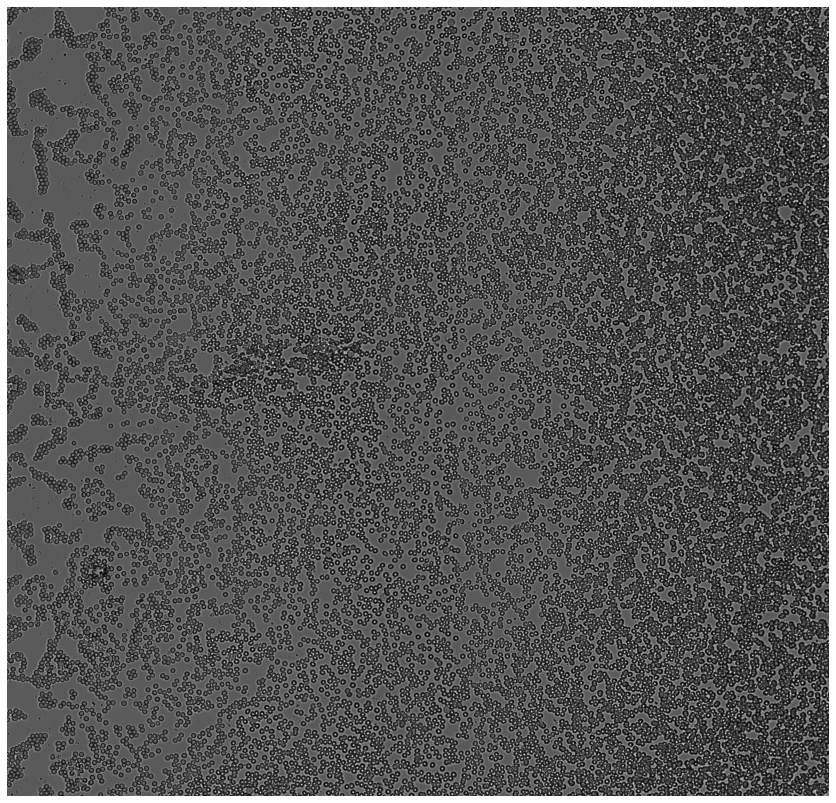

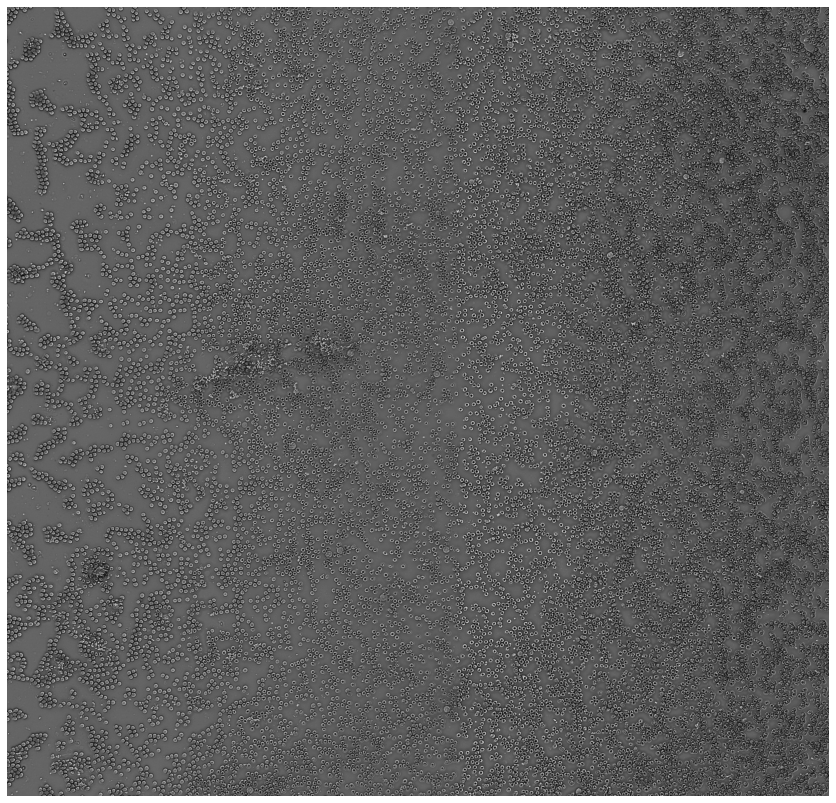

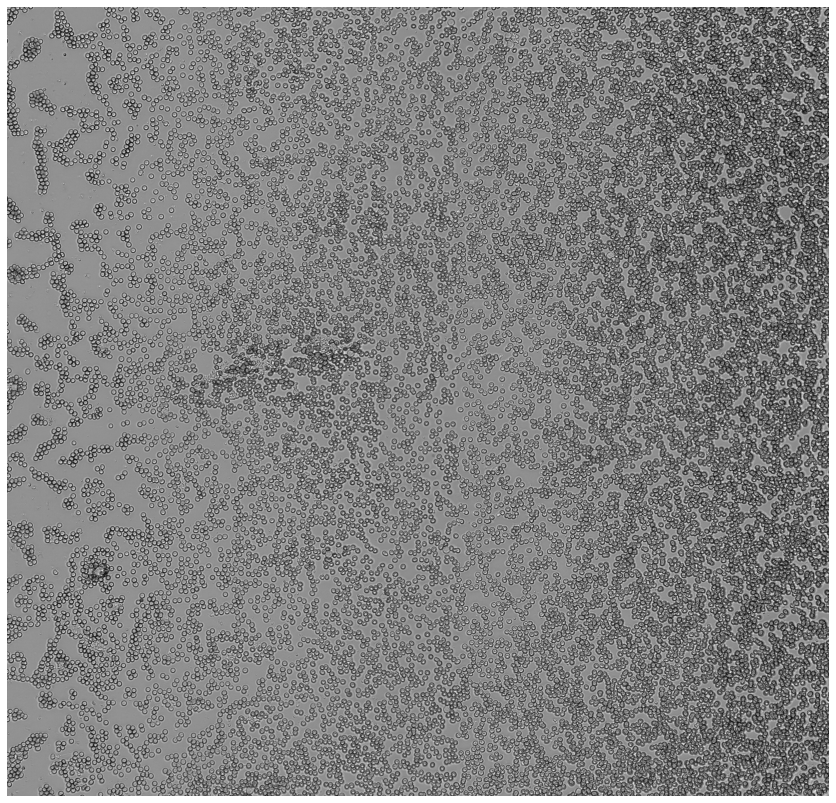

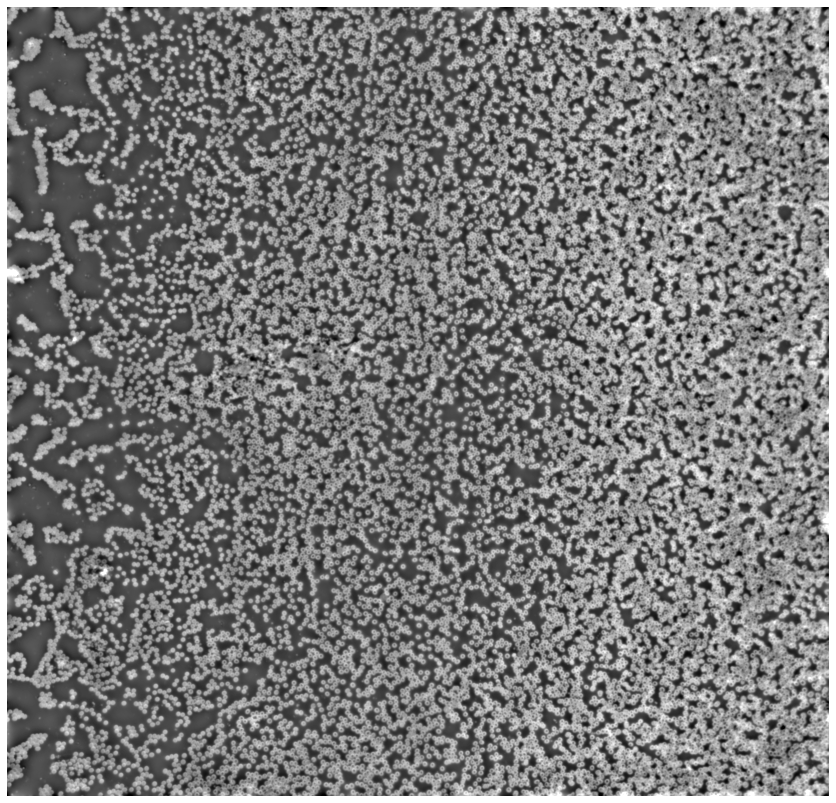

In [5]:
# Save defocus and wavefront images
dpi = 300
valrange = [(None, None), (None, None), (None, None), (-2.2, 5.5)]
FigSavenames = [join(ResourceFpath, f"ffov_{im_name}.tif") for im_name in ("minus", "plus", "focus", "phase")]
for img, savename, vr in zip((minus, plus, focus, phase), FigSavenames, valrange):
    fig, ax = plt.subplots(figsize=[sz/dpi for sz in img.T.shape])
    ax.imshow(img, cmap="gray", vmin=vr[0], vmax=vr[1])
    ax.set_xticks([])
    ax.set_yticks([])
    for sp in ["top", "bottom", "left", "right"]:
        ax.spines[sp].set_visible(False)
    fig.tight_layout(pad=0)
#     fig.savefig(savename, dpi=dpi)

### Single Cell Visualization

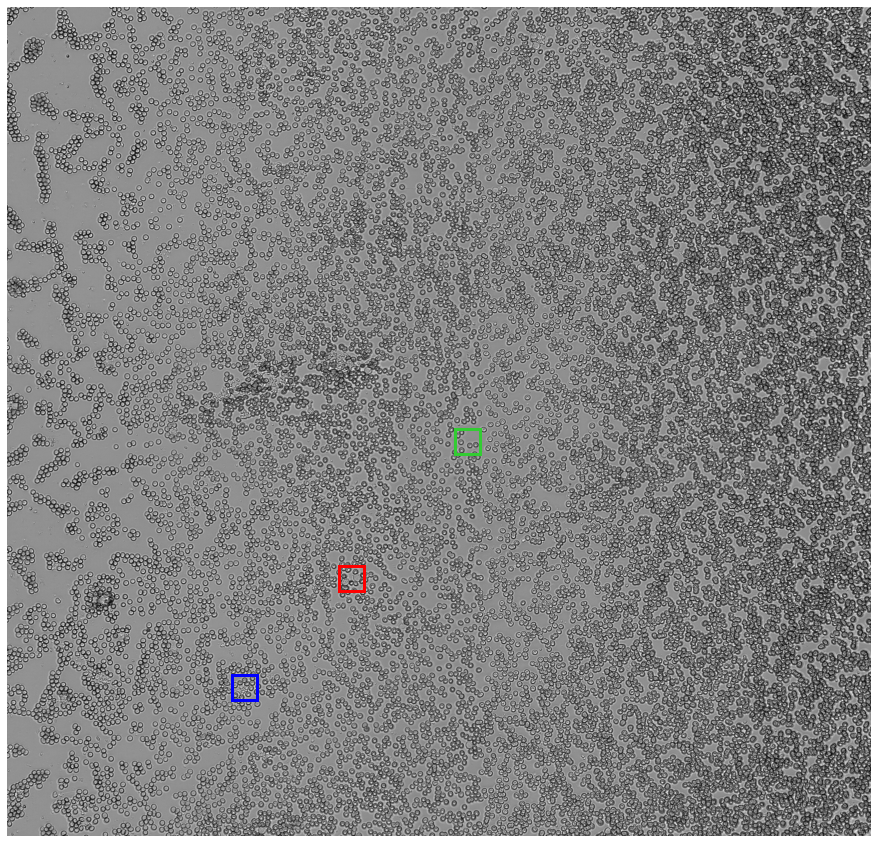

In [6]:
# bboxes element: (x_start, y_start, w, h)
interest_roi_bboxes = [(1315, 2218, 100, 100),
                       (890, 2650, 100, 100),
                       (1775, 1672, 100, 100)]

phase_rois = []
focus_rois = []
colors = ("r", "b", "limegreen")
fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(focus, cmap="gray")
ax.set_xticks([])
ax.set_yticks([])
for sp in ["top", "bottom", "right", "left"]:
    ax.spines[sp].set_visible(False)
for roi_bbox, c in zip(interest_roi_bboxes, colors):
    x, y, w, h = roi_bbox
    rect = plt.Rectangle((x, y), w, h, fill=False, color=c, linewidth=3)
    ax.add_patch(rect)
    phase_rois.append(phase[y:y+h, x:x+w])
    focus_rois.append(focus[y:y+h, x:x+w])
plt.tight_layout(pad=0)
# plt.savefig(join(ResourceFpath, "single_cells_labeled_focus.tif"), dpi=300)

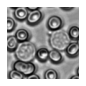

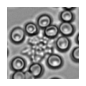

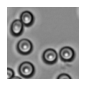

In [10]:
for i, roi in enumerate(focus_rois):
    fig, ax = plt.subplots(figsize=(1, 1))
    ax.imshow(roi, cmap="gray")
    ax.set_xticks([])
    ax.set_yticks([])
    for sp in ["top", "bottom", "right", "left"]:
        ax.spines[sp].set_visible(False)
    plt.tight_layout(pad=0)
    plt.savefig(join(ResourceFpath, "{}.tif".format(i)), dpi=200)

In [33]:
# save single cell mats
savemat(join(ResourceFpath, "single_cells.mat"), 
        mdict={"wbc": phase_rois[0], "platelet": phase_rois[1], "rbc": phase_rois[2]})

### Subview Recognition 

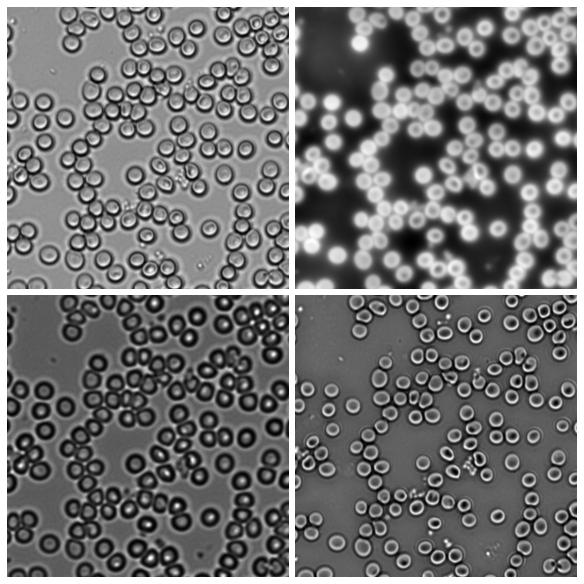

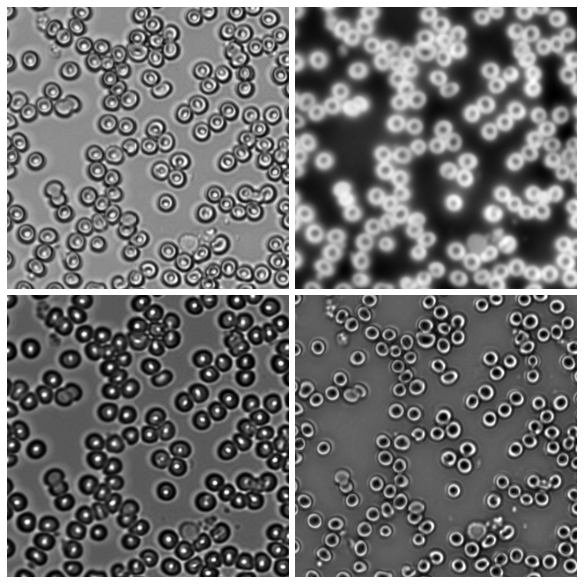

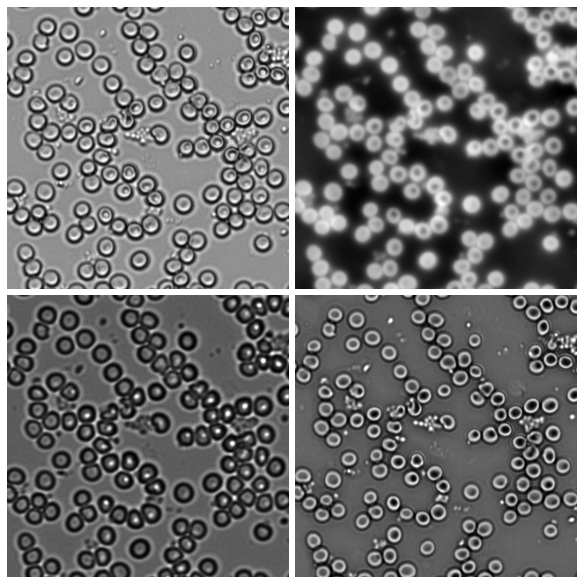

In [5]:
# Large FoV BloodSmear recognition
import torch

# Subview extract
# ck.img_show(phase, v_min=-2, v_max=5.8)
center_points = [(2048, 1034), (620, 1890), (740, 910)]
subview_tensorlist = []
for point in center_points:
    hc, wc = point
    yslice, xslice = slice(hc - 160, hc + 160), slice(wc - 160, wc + 160)
    subview = [img[yslice, xslice] for img in (focus, phase, minus, plus)]
    subview_tensorlist.append(subview)

for imtensor in subview_tensorlist:
    ck.img_show(*imtensor, figsize=(8, 8))

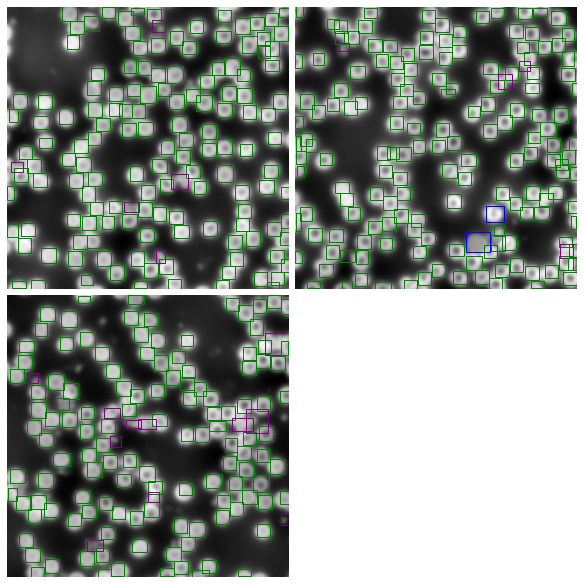

In [9]:
# Subview recognition
from Deeplearning.evaluate import PredHandle
from Deeplearning.util.dataset import ANCHORS

ModelName = "D:\\Workspace\\Blood Recognition\\models\\plan_8.4\\yolov5_1211-141810.pth"
batched_subview_tensors = torch.tensor(subview_tensors, dtype=torch.float32).to("cuda")
yolomodel = torch.load(ModelName).to("cuda")
model_output = yolomodel(batched_subview_tensors)
pred_params = {
    "n_class":3,
    "grid_size": 40,
    "device": "cpu",
    "anchors": ANCHORS,
    "conf_thres": 0.9,
    "image_shape": (320, 320),
    "nms_overlapping_thres": 0.2
}

# Results processing
phand = PredHandle(model_output.detach().to("cpu"), **pred_params)
phand.predict_collection_show(batched_subview_tensors)

### Results Saving
Subview recognitions visualizing and Figure producting 

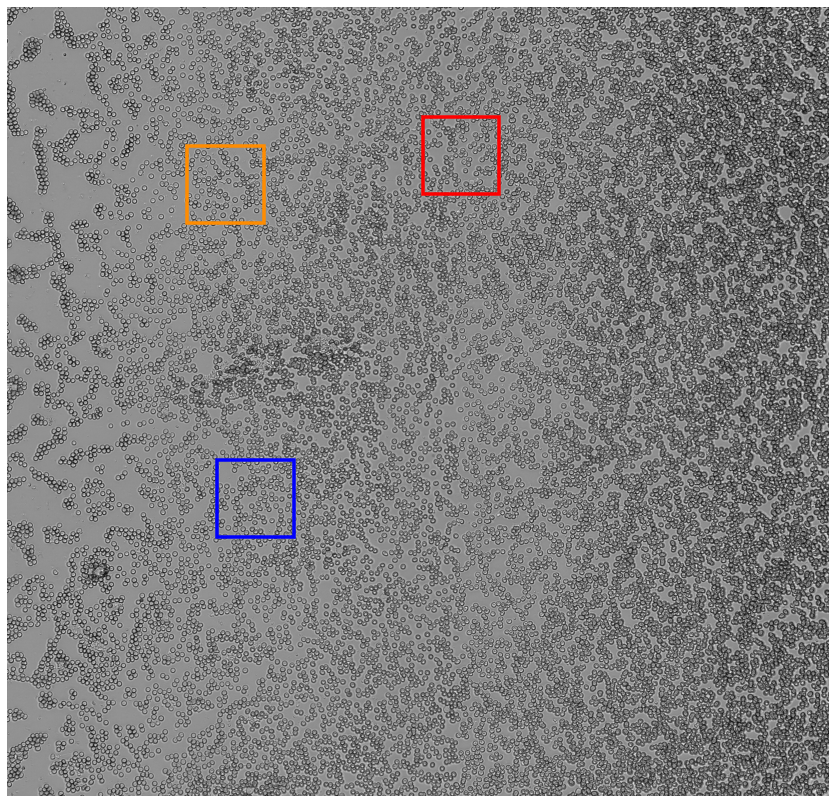

In [15]:
# Annotating the subview in the FFoV image
dpi = 300
figsize = [sz/dpi for sz in focus.T.shape]
center_points = [(2048, 1034), (620, 1890), (740, 910)]
fig, ax = figure_preproduction(figsize=figsize, constrained_layout=False)
ax.imshow(focus, cmap="gray")
for i, point in enumerate(center_points):
    h, w = point
    rect = Rectangle((w-160, h-160), 320, 320, fill=False, color=["b", "r", "darkorange"][i], linewidth=3.5)
    ax.add_patch(rect)
fig.tight_layout(pad=0)
fig.savefig(join(ResourceFpath, "bbox_labeled_focus.tif"), dpi=dpi)

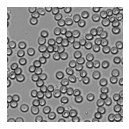

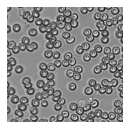

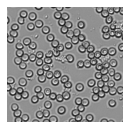

In [100]:
# Subview focus images visualizing and saving
dpi = 300
for i, mods in enumerate(batched_subview_tensors):
    subview_focus = mods.to("cpu").detach()[0]
    fig, ax = figure_preproduction(figsize=(1.5*320/dpi, 1.5*320/dpi), constrained_layout=False)
    ax.imshow(subview_focus, cmap="gray")
    fig.tight_layout(pad=0)
    fig.savefig(join(ResourceFpath, "subviews_recognitions", f"focus_{i}.tif"), dpi=300)

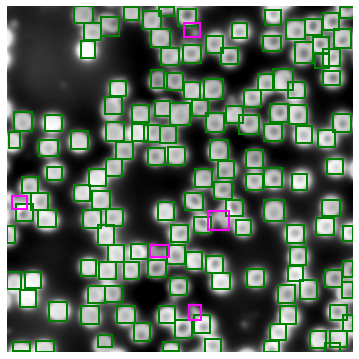

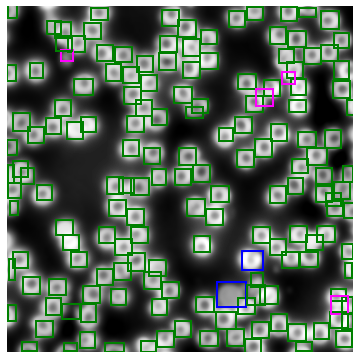

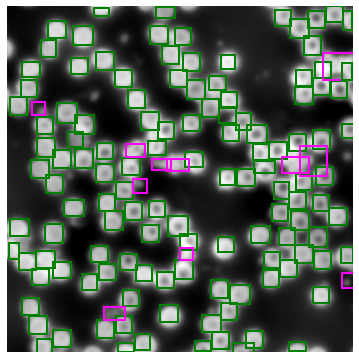

In [10]:
# How to enhance the contrast of displayed phase images
def pha_visual(img): return clip(img, quantile(img, 0.01), quantile(img, 0.999))

# Properties extraction
images = batched_subview_tensors.to("cpu").detach()
properties = [phand[item] for item in ("xy", "wh", "conf", "labels")]

# Figures Plotting and Saving
dpi = 100 
figsize = (1.5*320/dpi, 1.5*320/dpi)
colors = ("g", "b", "fuchsia")
SubviewPhaSavenames = [join(ResourceFpath, "subviews_recognitions", f"phase_{i}.tif") for i in range(3)]
for i, (mods, savename, xy, wh, conf, labels) in enumerate(zip(images, SubviewPhaSavenames, *properties,)):
    fig, ax = figure_preproduction(figsize=figsize, constrained_layout=False)
    ax.imshow(pha_visual(mods[1]), cmap="gray")
    for (x, y), (w, h), cf, lbl in zip(xy, wh, conf, labels):
        ax.add_patch(Rectangle((x-w/2, y-h/2), w, h, fill=False, color=colors[lbl], linewidth=2))
    fig.tight_layout(pad=0)
#     fig.savefig(savename, dpi=dpi)